#**Создание и обучение модели семантической сегментации**

В качестве данных для обучения и валидации используются данные Inria Aerial Image Labeling Dataset (project.inria.fr/aerialimagelabeling/), которые представляют собой изображения размером 5000х5000. Формат данных GeoTIFF, то есть они имеют пространственную привязку.

В директории 📁 AerialImageDataset:

├── 📁 train

│   ├── 📁 images

│   └── 📁 gt                       

└── 📁 test                  

причем в train содержатся изображения с масками (images и gt), а в test - только изображения.

При обучении модели все изображения из train (180 шт+ маски) хранились на гугл диске.



In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


## Кастомный датасет и даталоадер, загрузка обучающей выборки


*   **Подготовка данных для обучения:** все 180 изображений с соответствующими им масками делятся на тайлы фиксированного размера 512х512 и сохраняются во временной директории '/content/tiled_train/images`, `/content/tiled_train/gt` (ограниченное место на гугл диске не позволяет сохранить все тайлы с масками на нём).

*   **Кастомный датасет:** создается датасет (PyTorch Dataset class) `INRIATiled` для созданных тайлов и масок. В него загружаются изображения,преобразуются цвета (из BGR в RGB) и нормализуются (в диапазон [0, 1]) как для изображений, так и для масок, добавляются аугментации `HorizontalFlip`, `VerticalFlip` и `RandomRotate90`, которые добавляют "разнообразия" в данные для обучения.

*   **Разделение данных:** создаются даталоадеры для обучающей, валидационной и тестовой выборок.





**Подготовка данных для обучения**

In [ ]:
import os
import cv2
import glob

# Target tile size
TARGET_SIZE = 512

# Path to train data
path_train = '/content/drive/MyDrive/AerialImageDataset/train'
train_image_dir = os.path.join(path_train, "images")
train_mask_dir = os.path.join(path_train, "gt")

# Output directories for tiled data
tiled_train_base_dir = '/content/tiled_train'
tiled_train_image_dir = os.path.join(tiled_train_base_dir, "images")
tiled_train_mask_dir = os.path.join(tiled_train_base_dir, "gt")

os.makedirs(tiled_train_image_dir, exist_ok=True)
os.makedirs(tiled_train_mask_dir, exist_ok=True)
img_paths = sorted(glob.glob(os.path.join(train_image_dir, "*.tif")))
mask_paths = sorted(glob.glob(os.path.join(train_mask_dir, "*.tif")))

# Iterate through each original image and its corresponding mask
for i, (img_path, mask_path) in enumerate(zip(img_paths, mask_paths)):
    img_filename = os.path.splitext(os.path.basename(img_path))[0]
    mask_filename = os.path.splitext(os.path.basename(mask_path))[0]

    # Load image and mask
    img = cv2.imread(img_path)
    mask = cv2.imread(mask_path)

    # Ensure filenames match and dimensions are consistent
    assert img_filename == mask_filename, f"Image and mask filenames do not match: {img_filename} vs {mask_filename}"
    assert img.shape[:2] == mask.shape[:2], f"Image and mask dimensions do not match for {img_filename}"

    k = 0 # Tile index
    # Iterate through the image to extract fixed-size, non-overlapping tiles
    for y in range(0, img.shape[0], TARGET_SIZE):
        for x in range(0, img.shape[1], TARGET_SIZE):
            img_tile = img[y : y + TARGET_SIZE, x : x + TARGET_SIZE]
            mask_tile = mask[y : y + TARGET_SIZE, x : x + TARGET_SIZE]

            # Save only full-sized tiles
            if img_tile.shape[0] == TARGET_SIZE and img_tile.shape[1] == TARGET_SIZE:
                # Save image tile
                out_img_path = os.path.join(tiled_train_image_dir, f"{img_filename}_{k}.jpg")
                cv2.imwrite(out_img_path, img_tile)

                # Save mask tile
                out_mask_path = os.path.join(tiled_train_mask_dir, f"{mask_filename}_{k}_m.png") # Masks usually saved as PNG for lossless
                cv2.imwrite(out_mask_path, mask_tile)

            k += 1
    print(f"Processed {img_filename} {i + 1}/{len(img_paths)}")
print(f"Tiling complete. Tiled images saved to {tiled_train_image_dir} and masks to {tiled_train_mask_dir}")

Processed austin1 1/180
Processed austin10 2/180
Processed austin11 3/180
Processed austin12 4/180
Processed austin13 5/180
Processed austin14 6/180
Processed austin15 7/180
Processed austin16 8/180
Processed austin17 9/180
Processed austin18 10/180
Processed austin19 11/180
Processed austin2 12/180
Processed austin20 13/180
Processed austin21 14/180
Processed austin22 15/180
Processed austin23 16/180
Processed austin24 17/180
Processed austin25 18/180
Processed austin26 19/180
Processed austin27 20/180
Processed austin28 21/180
Processed austin29 22/180
Processed austin3 23/180
Processed austin30 24/180
Processed austin31 25/180
Processed austin32 26/180
Processed austin33 27/180
Processed austin34 28/180
Processed austin35 29/180
Processed austin36 30/180
Processed austin4 31/180
Processed austin5 32/180
Processed austin6 33/180
Processed austin7 34/180
Processed austin8 35/180
Processed austin9 36/180
Processed chicago1 37/180
Processed chicago10 38/180
Processed chicago11 39/180
Pr

**Кастомный датасет и деление данных**

In [ ]:
import torch
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset, DataLoader, random_split
import cv2
import os
import numpy as np
import random

# Set the seed for reproducibility
def set_seed(seed):
    torch.manual_seed(seed)  # PyTorch random seed
    np.random.seed(seed)  # NumPy random seed
    random.seed(seed)  # Python random seed
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)  # Set seed for all GPUs (if using CUDA)


# Set the seed value (choose any integer)
set_seed(42)

# Dataset class for tiled images
class INRIATiled(Dataset):
    def __init__(self, images_dir, masks_dir, transform=None):
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.transform = transform
        self.images = [
            f
            for f in sorted(os.listdir(self.images_dir))
            if f.endswith(('.jpg', '.jpeg', '.png', '.tif', '.tiff'))
        ]
        self.masks = [
            f
            for f in sorted(os.listdir(self.masks_dir))
            if f.endswith(('.jpg', '.jpeg', '.png', '.tif', '.tiff'))
        ]
        # Ensure masks are sorted in the same way as images
        self.masks.sort(key=lambda x: x.replace('_m.png', ''))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.images_dir, self.images[idx])
        mask_path = os.path.join(self.masks_dir, self.masks[idx])

        # Read the image with OpenCV
        image = cv2.imread(img_path, cv2.IMREAD_COLOR)  # Read as BGR
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
        image = image.astype(np.float32) / 255.0  # Normalize to [0, 1]

        # Read the mask with OpenCV
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Read as grayscale
        mask = mask.astype(np.float32) / 255.0  # Normalize to [0, 1]

        # Apply transformations
        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented["image"]
            mask = augmented["mask"]

        # Expand the mask dimensions to add a channel dimension
        mask = mask.unsqueeze(dim=0)

        return image, mask


# Define transformations with Albumentations
transform_tiled = A.Compose(
    [
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        ToTensorV2(),
    ]
)

# Define paths for the tiled dataset
tiled_images_dir = '/content/tiled_train/images'
tiled_masks_dir = '/content/tiled_train/gt'

# Create the full tiled dataset
full_tiled_dataset = INRIATiled(
    images_dir=tiled_images_dir, masks_dir=tiled_masks_dir, transform=transform_tiled
)

# Calculate the sizes for train, val, and test splits
total_tiles = len(full_tiled_dataset)
train_size = int(0.7 * total_tiles)
val_size = int(0.2 * total_tiles)
test_size = total_tiles - train_size - val_size

# Split the dataset
INRIA_train_tiled_dataset, INRIA_val_tiled_dataset, INRIA_test_tiled_dataset = random_split(
    full_tiled_dataset, [train_size, val_size, test_size]
)

# Create data loaders
INRIA_train_tiled_loader = DataLoader(
    dataset=INRIA_train_tiled_dataset, batch_size=16, shuffle=True, num_workers=2
)

INRIA_val_tiled_loader = DataLoader(
    dataset=INRIA_val_tiled_dataset, batch_size=2, shuffle=False, num_workers=2
)
INRIA_test_tiled_loader = DataLoader(
    dataset=INRIA_test_tiled_dataset, batch_size=4, shuffle=False, num_workers=2
)

print(f"Training Tiled Dataset Length: {len(INRIA_train_tiled_dataset)}")
print(f"Validation Tiled Dataset Length: {len(INRIA_val_tiled_dataset)}")
print(f"Testing Tiled Dataset Length: {len(INRIA_test_tiled_dataset)}")

Training Tiled Dataset Length: 10206
Validation Tiled Dataset Length: 2916
Testing Tiled Dataset Length: 1458


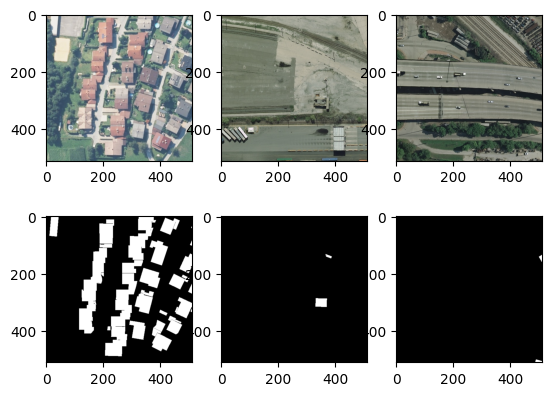

In [ ]:
# Visualisation
import matplotlib.pyplot as plt

for i in range(3):
    image, mask = INRIA_train_tiled_dataset[i]
    plt.subplot(2, 3, i + 1)
    plt.imshow(image.permute(1, 2, 0), cmap="gray")
    plt.subplot(2, 3, 3 + i + 1)
    plt.imshow(mask.permute(1, 2, 0), cmap="gray")

plt.show()

## Реализация модели обучения

Основная цель проекта — определение площади застройки на аэрофотоснимках. Это требует пиксельной точности при определении контуров зданий, поскольку площадь рассчитывается как сумма всех пикселей, которые относятся к "зданиям", умноженная на площадь одного пикселя. В случае детекции для каждого здания определяются bounding box, которые «обрамляют здания рамочками» и тем самым рассчитываемая площадь будет завышена. К преимуществам сегментации можно отнести и то, что пиксельные контуры могут быть любой сложности (учитывая, например, многоскатные крышы, здания различной форма и т.д., если они правильно определены моделью сегментации), и площадь застройки рассчитывается напрямую, без постобработки через полученную маску с учетом геопривязки изображения.

В качестве модели для обучения была выбрана модель **U-Net** из библиотеки smp (segmentation_models_pytorch). Это одна из популярных и эффективных архитектур, особенно применительно к задачам сегментации изображений (изначально она была разработана для медицинских изображений, но хорошо зарекомендовала себя и для других приложений, в частности и для выделения объектов на спутниковых данных). Модель состоит из энкодера и декодера, а её ключевая особенность — т.н. skip-connections, которые передают информацию с "более высокой точностью" из энкодера в декодер, помогая восстанавливать мелкие детали.

Для повышения точности используется предобученный энкодер ResNet50 с весам  ImageNet. Это помогло значительно ускорить обучение и улучшить его качество, так как модель уже умеет извлекать общие признаки изображений.

Ниже реализован самостоятельный цикл обучения Training Loop  выбранной архитектуры модели.

In [ ]:
# Установка библиотеки segmentation_models_pytorch
!pip install segmentation_models_pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 6.5 MB/s eta 0:00:00


In [ ]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 20.6 MB/s eta 0:00:00


###Обучение модели

In [ ]:
import torch

from tqdm.notebook import tqdm
from IPython.display import clear_output
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches
import segmentation_models_pytorch as smp

In [ ]:
def train_single_epoch(model, optimizer, criterion, train_dataloader, device):
    model.train()

    avg_loss = 0
    for X_batch, Y_batch in tqdm(train_dataloader):
        X_batch = X_batch.to(device)
        Y_batch = Y_batch.to(device)

        optimizer.zero_grad() # set parameter gradients to zero before forward-pass

        Y_pred = model(X_batch)
        loss = criterion(Y_pred, Y_batch) # forward-pass

        loss.backward()  # backward-pass
        optimizer.step()  # update weights

        # calculate loss
        avg_loss += loss.item()

    avg_loss = avg_loss/len(train_dataloader)

    return model, avg_loss

In [ ]:
def validate_single_epoch(model, criterion, valid_dataloader, metrics, device, plot=False):
    model.eval()

    avg_loss = 0

    for metric in metrics:
        metric.reset()

    with torch.no_grad():
        for X_batch, Y_batch in tqdm(valid_dataloader):
            X_batch = X_batch.to(device)
            Y_batch = Y_batch.to(device)

            Y_pred = model(X_batch)
            loss = criterion(Y_pred, Y_batch)
            avg_loss += loss.item()

            # Updating metrics
            for metric in metrics:
                metric.update(Y_pred, Y_batch)

    avg_loss = avg_loss / len(valid_dataloader)

    # Compute final metric values
    computed_metrics = {m.__class__.__name__: m.compute().item() for m in metrics}
    avg_iou = computed_metrics['BinaryJaccardIndex'] # IoU

    if plot:
        clear_output(wait=True)
        our_labels = {
            0: 'NonBuilding',
            1: 'Building',
        }

        fig, axes = plt.subplots(1, 3, figsize=(18, 6))

        original_image_np = X_batch[1].permute(1, 2, 0).cpu().numpy()
        original_mask_np = Y_batch[1].squeeze().cpu().numpy()

        axes[0].imshow(original_image_np)
        axes[0].set_title("Original Image (Tile)")
        axes[0].axis('off')

        diagram = axes[1].imshow(original_mask_np, cmap='gray', interpolation='none')
        values = np.unique(original_mask_np)
        colors = [diagram.cmap(diagram.norm(value)) for value in values]
        patches = [mpatches.Patch(color=colors[i], label=f"{i} - {our_labels[i]}") for i in range(len(values))]
        axes[1].legend(handles=patches, bbox_to_anchor=(1.00, 1), loc=1, borderaxespad=0.)
        axes[1].set_title("Original Mask (Tile)")
        axes[1].axis('off')

        pred_mask_display = (Y_pred[1].squeeze().cpu().numpy() > 0.5)
        axes[2].imshow(pred_mask_display, cmap='gray', interpolation='none')
        axes[2].set_title(f"Predicted mask (Tile)\nIoU = {avg_iou:.3f}")
        axes[2].axis('off')

        plt.tight_layout()
        plt.show()

    return model, avg_loss, avg_iou

In [ ]:
def train(model, optimizer, criterion, epochs, train_dataloader, valid_dataloader, device, ckpt_path, plot_loss = False):

    total_train_loss = []
    total_val_loss = []
    total_val_iou = []

    best_val_loss = float('inf')
    best_val_iou = 0

    for epoch in tqdm(range(epochs)):

        model, train_loss = train_single_epoch(model, optimizer, criterion, train_dataloader, device)
        model, val_loss, val_iou = validate_single_epoch(model, criterion, valid_dataloader, metrics, device, plot=plot_loss)
        print(f'Epoch {epoch}: train loss = {train_loss:.4f}')
        print(f'Epoch {epoch}: val loss = {val_loss:.4f}')
        print(f'Epoch {epoch}: val iou = {val_iou:.4f}')

        total_train_loss.append(train_loss)
        total_val_loss.append(val_loss)
        total_val_iou.append(val_iou)

        if plot_loss:
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

            ax1.plot(total_train_loss, label='train loss')
            ax1.plot(total_val_loss, label='val loss')
            ax1.set_title("Loss")
            ax1.legend()

            ax2.plot(total_val_iou, label='val IoU')
            ax2.set_title("IoU")
            ax2.legend()

            plt.show()


        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(model.state_dict(), f'{ckpt_path}/epoch_{epoch}_best_val_loss.pt')

        # Save model after each epoch (or best IoU/Loss)
        torch.save(model.state_dict(), f'{ckpt_path}/epoch_{epoch}_val_iou.pt')

    statistics = {'train loss': total_train_loss,
                  'val_loss': total_val_loss,
                  'val_iou': total_val_iou}

    return model, statistics

### Выбор функции потерь, оптимизатора и метрик


 *  **Модель U-Net** с бэкбоном ResNet-50
 и предобученными весами ImageNet с
 in_channels=3 для RGB изображений
 classes=1 для бинарной сегментации (здание/фон).

 * **Определение функции потерь**:
 BCEWithLogitsLoss хорошо подходит для бинарной сегментации,  она объединяет Sigmoid и Binary Cross Entropy для большей численной стабильности.
 Хорошо работает с пиксельной классификацией, штрафуя за каждый неверно классифицированный пиксель.
 DiceLoss хорошо подходит для несбалансированных классов (например, когда объектов гораздо меньше, чем фона), напрямую оптимизируя метрику IoU (Intersection over Union), которая более актуальна для сегментации. Поэтому DiceLoss и BCEWithLogitsLoss были объединены для определения функции потерь с коэффициентами 0.3 и 0.7 соответственно.
 Коэффициенты выбраны эмпирически на валидационной выборке. BCEWithLogitsLoss обеспечивает стабильность градиентов и обучение на каждом пикселе, предотвращая игнорирование фона. DiceLoss в основном используется для коррекции IoU: фокусируется на пересечении объектов (здания /фон), борется с дисбалансом классов.

 * **Оптимизатор Adam** выбран как один из самых популярных и эффективных для обучения U-Net.

* **Метрики для обучения**: IoU (Intersection over Union) - стандартная метрика для сегментации [inria.hal.science/hal-01468452/document], измеряющая долю совпадающих пикселей между предсказанной и истинной масками зданий.



In [ ]:
import segmentation_models_pytorch as smp
import torch
import torch.nn as nn
import torchmetrics as tm

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Используемое устройство: {device}")

torch.cuda.empty_cache()

# Model initialization
model = smp.Unet(
    encoder_name="resnet50",        # encoder resnet50
    encoder_weights="imagenet",     # `imagenet` pre-trained weights for encoder initialization
    in_channels=3,                  # model input channels ( 3 for RGB)
    classes=1,                      # model output channels (number of classes 1: building/nonbuilding)
).to(device)

print("Модель U-Net с бэкбоном ResNet-50 успешно создана.")

# Loss function as combination of dice and bce losses
loss_function_dice = smp.losses.DiceLoss(mode='binary', smooth=1.0)
loss_function_bce = nn.BCEWithLogitsLoss()

def combined_loss(y_pr, y_gt):
    return 0.3 * loss_function_dice(y_pr, y_gt) + 0.7 * loss_function_bce(y_pr, y_gt)

criterion = combined_loss

print(f"Функция потерь: Combined (DiceLoss + BCEWithLogitsLoss)")

# Optimizator definition
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

print(f"Оптимизатор: {optimizer.__class__.__name__}")

# Metrics definition
metrics = [
    tm.JaccardIndex(task="binary", threshold=0.5).to(device), # IoU в torchmetrics это JaccardIndex
    tm.F1Score(task="binary", threshold=0.5).to(device), # F1-score
    tm.Accuracy(task="binary", threshold=0.5).to(device),
    tm.Recall(task="binary", threshold=0.5).to(device),
    tm.Precision(task="binary", threshold=0.5).to(device)
]

print(f"Метрики: {[m.__class__.__name__ for m in metrics]}")

epochs = 20
ckpt_path = '/content/drive/MyDrive/checkpoints+'

Используемое устройство: cpu


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Модель U-Net с бэкбоном ResNet-50 успешно создана.
Функция потерь: Combined (DiceLoss + BCEWithLogitsLoss)
Оптимизатор: Adam
Метрики: ['BinaryJaccardIndex', 'BinaryF1Score', 'BinaryAccuracy', 'BinaryRecall', 'BinaryPrecision']


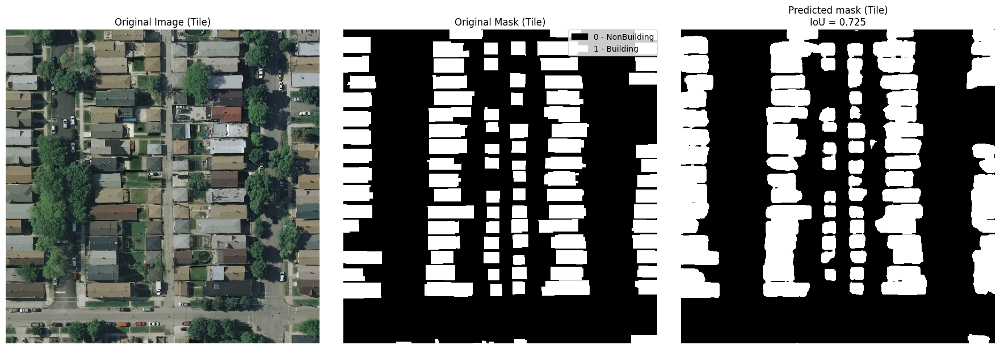

Epoch 5: train loss = 0.1535
Epoch 5: val loss = 0.1694
Epoch 5: val iou = 0.7253


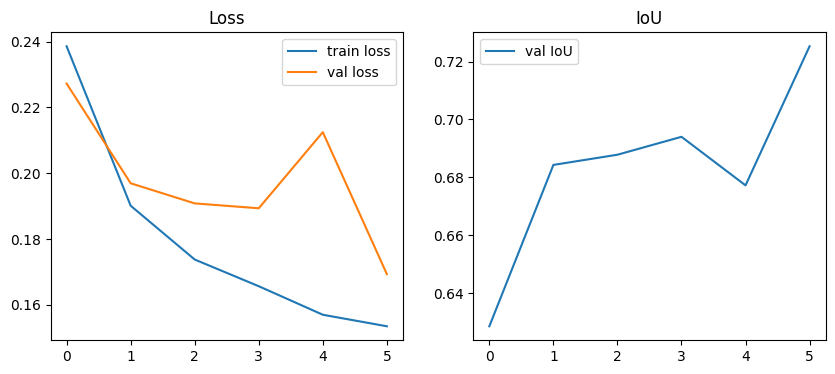

  0%|          | 0/638 [00:00<?, ?it/s]

  0%|          | 0/1458 [00:00<?, ?it/s]

In [ ]:
os.makedirs(ckpt_path, exist_ok=True)

model, statistics = train(model, optimizer, criterion, epochs, INRIA_train_tiled_loader, INRIA_val_tiled_loader, device, ckpt_path, plot_loss = True)


Обучение модели велось в colab, где ресурсы были ограничены. Поэтому лучшее состояние модели сохранялось и затем модель ещё дообучалась на нескольких эпохах.

Стало интересно  проверить работоспособность обученной версии модели на изображениях из тестовой выборки (без истинных масок).
Для этого для нескольких изображениях из тестовой выборки были выполнены следующие шаги:

1. деление исходного тестового изображения на тайлы (размер 512х512), которые сохраняются во временной директории /content/tiled_test;
2. создание датасета INRIATiledNoLabels;
3. функция get_all_tiled_predictions, которая для каждого тайла реализует предсказание маски,а затем сохраняет его предсказанную маску и исходные размеры.

Следует отметить, что размер исходных изображений составляет 5000х5000, и не делится ровно на размер тайла (512х512). Поэтому справа и снизу будут "краевые" тайлы меньших размеров, которые дозаполненяются (т.н. padding) чёрными пикселями до требуемого размера тайла (512×512), чтобы удовлетворить требованиям входа модели.
Модель затем делает предсказание на этом дополненном тайле. В результате предсказанная маска также будет иметь дополненные размеры (512×512). Но эти дополненные области предсказанной маски не соответствуют никакой реальной части исходного изображения. Поэтому маска обрезается обратно до её исходных original_h (высоты) и original_w (ширины) до дополнения.

4. функция reassemble_full_image_mask собирает из предсказанных масок для каждого тайла полноразмерную маску изображения, учитывая соответствующихе размеры исходного изображения.



5. Наконец, визуализируется собранная предсказанная маска, наложенная поверх исходного тестового изображения.

Учитывая что входные изображения имеют большой размер и идеально не делятся на размер тайла, видно, что на границах изображений, обрабатываемых частичными тайлами, модель отрабатывает недостаточно хорошо. В собранном изображении на границах прослеживается наличие артефактов от заполнения.

**Проблема распознавания краевых тайлов.** Это связано с тем, что модель обучена только на полных, непададингованных (non-padded) тайлах размером 512x512. Однако во время предсказания используются тайлы, размер которых может быть меньше 512x512 (крайние части изображений). Эти меньшие тайлы дополняются нулями (padded with zeros) до размера 512x512, прежде чем попасть в модель.
Модель никогда не видела такие дополненные области во время обучения. Когда она сталкивается с нулями по краям, она хуже распознает объекты в тех частях тайла, которые примыкают к нулевому паддингу. Именно поэтому прослеживается ухудшение качества на правом и нижнем краях изображения, где оригинальное содержимое граничит с добавленными нулями.

Поэтому было реализовано создание  «перекрывающихся тайлов», которые включают как 'нормальные' тайлы, так и 'краевые' тайлы с паддингом, что приводит к улучшению предсказания маски на границе. Кроме того, использование перекрывающихся тайлов во время обучения позволяет увеличить объем используемых данных, тем самым помогает ей стать более устойчивой к смещениям и улучшает ее способность к обобщению.

Поэтому далее модель дообучалась на тайлах "с пересечениями", чтобы также учесть и краевые тайлы изображения.
Датасет для обучения и валидации заново готовился.



In [ ]:
import os
import cv2
import glob

# Target tile size
TARGET_SIZE = 512

# Path to original test data
path_test = '/content/drive/MyDrive/AerialImageDataset/test'

# Output directory for tiled data
tiled_test_base_dir = '/content/tiled_test'
os.makedirs(tiled_test_base_dir, exist_ok=True)

# Sorted lists of image and mask paths
img_paths = sorted(glob.glob(os.path.join(path_test, "*.tif")))

# Tiling (non-overlapping): each original image and its corresponding mask
for i, (img_path) in enumerate(img_paths):
    img_filename = os.path.splitext(os.path.basename(img_path))[0]
    img = cv2.imread(img_path)

    k = 0 # Tile index
    for y in range(0, img.shape[0], TARGET_SIZE):
        for x in range(0, img.shape[1], TARGET_SIZE):
            img_tile = img[y : y + TARGET_SIZE, x : x + TARGET_SIZE]
            out_img_path = os.path.join(tiled_test_base_dir, f"{img_filename}_{k}.jpg") # Save all tiles
            cv2.imwrite(out_img_path, img_tile)
            k += 1
    print(f"Processed {img_filename} {i + 1}/{len(img_paths)}")
print(f"Tiling complete. Tiled images saved to {tiled_test_base_dir} ")

Processed innsbruck10 1/2
Processed tyrol-e26 2/2
Tiling complete. Tiled images saved to /content/tiled_test 


In [ ]:
import cv2
import os
import glob

# List of all .tif image files
image_files = sorted(glob.glob(os.path.join(path_test, "*.tif")))
# Initialize an empty dictionary with original image dimensions
original_image_dimensions = {}

print("Collecting original image dimensions...")
for img_path in image_files:
    base_filename = os.path.splitext(os.path.basename(img_path))[0]
    original_image = cv2.imread(img_path)
    # Load image and store the height and width in the original_image_dimensions dictionary with the base filename as the key
    if original_image is not None:
        height, width, _ = original_image.shape
        original_image_dimensions[base_filename] = {'height': height, 'width': width}
        print(f"  - Found dimensions for {base_filename}: Height={height}, Width={width}")
    else:
        print(f"  - Error: Could not load image from {img_path}")

# Information about collected data.
print("\n--- All Collected Original Image Dimensions ---")
for filename, dims in original_image_dimensions.items():
    print(f"{filename}: {dims['height']}x{dims['width']}")
print("Collection complete.")

  - Found dimensions for innsbruck10: Height=5000, Width=5000
  - Found dimensions for tyrol-e26: Height=5000, Width=5000

--- All Collected Original Image Dimensions ---
innsbruck10: 5000x5000
tyrol-e26: 5000x5000
Collection complete.


In [ ]:
import torch
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset, DataLoader
import cv2
import os
import numpy as np
import random

# Dataset class for tiled test images without labels
class INRIATiledNoLabels(Dataset):
    def __init__(self, images_dir, transform=None):
        self.images_dir = images_dir
        self.transform = transform
        self.images = [
            f
            for f in sorted(os.listdir(self.images_dir))
            if f.endswith(('.jpg', '.jpeg', '.png', '.tif', '.tiff'))
        ]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_filename = self.images[idx]
        img_path = os.path.join(self.images_dir, img_filename)

        # Read the image with OpenCV
        image = cv2.imread(img_path, cv2.IMREAD_COLOR)  # Read as BGR
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
        image = image.astype(np.float32) / 255.0  # Normalize to [0, 1]

        # Store original dimensions before padding
        original_h, original_w = image.shape[0], image.shape[1]

        # Pad image to TARGET_SIZE if it's smaller
        if original_h < TARGET_SIZE or original_w < TARGET_SIZE:
            padded_image = np.zeros((TARGET_SIZE, TARGET_SIZE, 3), dtype=np.float32)
            padded_image[0:original_h, 0:original_w, :] = image
            image = padded_image

        # Apply transformations (only to image)
        if self.transform:
            augmented = self.transform(image=image)
            image = augmented["image"]

        return image, img_filename, (original_h, original_w)

# Define transformations for test images (no augmentations, just ToTensorV2)
transform_test_no_labels = A.Compose(
    [
        ToTensorV2(),
    ]
)

# Define path for the tiled test dataset (without labels)
tiled_test_images_dir = '/content/tiled_test'

# Create the tiled dataset for test images without labels
INRIA_test_no_label_dataset = INRIATiledNoLabels(
    images_dir=tiled_test_images_dir, transform=transform_test_no_labels
)

# Create a DataLoader for test images without labels
INRIA_test_no_label_loader = DataLoader(
    dataset=INRIA_test_no_label_dataset, batch_size=4, shuffle=False, num_workers=2
)

print(f"Test Dataset (no labels) Length: {len(INRIA_test_no_label_dataset)}")


Test Dataset (no labels) Length: 300


In [ ]:
# Define device for model loading
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Initialize the U-Net model architecture
loaded_model = smp.Unet(
    encoder_name="resnet50",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
).to(device)


# Specify the checkpoint path for the pre-trained U-Net weights
checkpoint_path = '/content/drive/MyDrive/checkpoints+/epoch_10_best_val_loss.pt'
# Load the state dictionary into the model
loaded_model.load_state_dict(torch.load(checkpoint_path, map_location=device))
final_model = loaded_model

In [ ]:
import torch
import numpy as np
from tqdm.notebook import tqdm
import re

def get_all_tiled_predictions(model, dataloader, device):
    model.eval() # Set the model to evaluation mode

    all_predicted_data = [] # Create an empty list to store filenames and predicted masks

    with torch.no_grad():
        for X_batch, filenames_batch, original_dims_batch in tqdm(dataloader, desc="Predicting all test tiles"):
            X_batch = X_batch.to(device)
            Y_pred = model(X_batch) # Obtain predictions from the model

            # Process Y_pred by applying torch.sigmoid and then thresholding at 0.5
            predicted_masks_batch = (torch.sigmoid(Y_pred) > 0.5).cpu().squeeze(1)

            # For each image in the batch, pair its filename with its predicted mask
            for i in range(len(filenames_batch)):
                filename = filenames_batch[i]
                predicted_mask = predicted_masks_batch[i].numpy()
                original_h, original_w = original_dims_batch[0][i].item(), original_dims_batch[1][i].item()

                # Crop the predicted mask back to its original dimensions before padding
                cropped_predicted_mask = predicted_mask[0:original_h, 0:original_w]

                # Extract the base filename (e.g., 'sfo36') from the tile filename
                base_filename_match = re.match(r'([a-zA-Z0-9_-]+)_\d+\.jpg', filename)
                if base_filename_match:
                    original_image_base_filename = base_filename_match.group(1)
                else:
                    original_image_base_filename = "unknown"

                all_predicted_data.append({
                    'original_image_base_filename': original_image_base_filename,
                    'filename': filename,
                    'predicted_mask': cropped_predicted_mask,
                    'original_h': original_h,
                    'original_w': original_w
                })

    return all_predicted_data

print("Collecting all tiled predictions...")
all_test_predictions = get_all_tiled_predictions(final_model, INRIA_test_no_label_loader, device)
print(f"Collected {len(all_test_predictions)} predicted masks.")


Predicting all test tiles:   0%|          | 0/75 [00:00<?, ?it/s]

Collected 300 predicted masks.


Reassembling predicted tiles into full-sized masks for all original images...
Reassembly complete. Reassembled masks for 2 images.

Visualizing all reassembled masks...


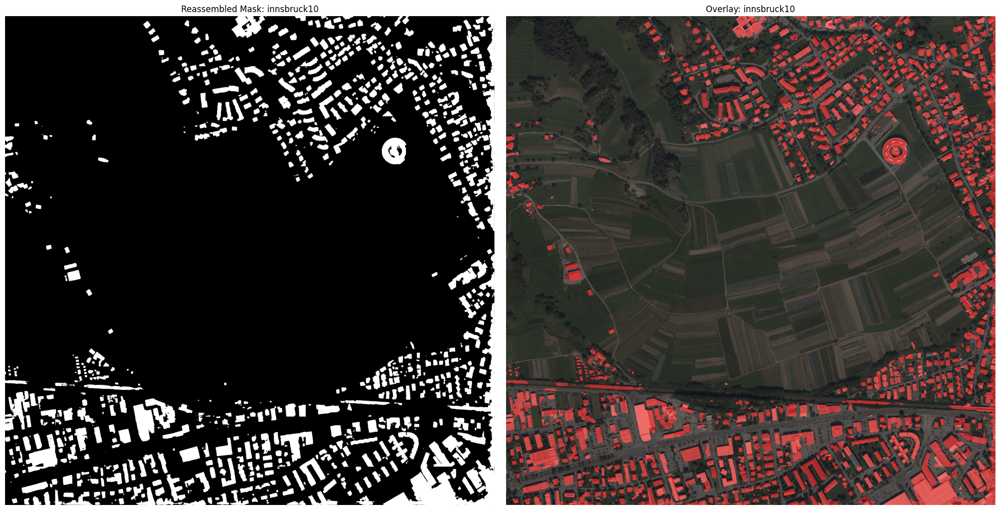

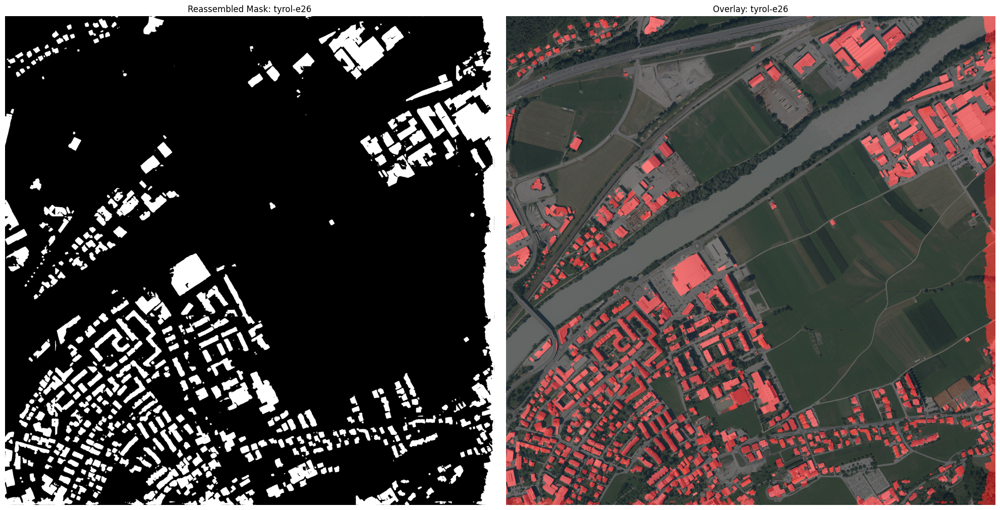

Visualization complete.


In [ ]:
import re
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

def reassemble_all_full_image_masks(all_tiled_predictions, original_image_dimensions, tile_size):
    reassembled_masks = {}

    # Group predictions by original image base filename
    grouped_predictions = {}
    for pred_data in all_tiled_predictions:
        base_filename = pred_data['original_image_base_filename']
        if base_filename not in grouped_predictions:
            grouped_predictions[base_filename] = []
        grouped_predictions[base_filename].append(pred_data)

    # Iterate through each original image's group of predictions
    for base_filename, predictions_for_image in grouped_predictions.items():
        if base_filename not in original_image_dimensions:
            print(f"Warning: Dimensions not found for {base_filename}. Skipping reassembly for this image.")
            continue

        original_height = original_image_dimensions[base_filename]['height']
        original_width = original_image_dimensions[base_filename]['width']

        # Initialize an empty mask for the full image
        full_mask = np.zeros((original_height, original_width), dtype=np.bool_)

        # Calculate number of tiles in rows and columns
        num_tiles_y = (original_height + tile_size - 1) // tile_size
        num_tiles_x = (original_width + tile_size - 1) // tile_size

        # Iterate through collected predictions and place them onto the full mask
        for prediction_data in predictions_for_image:
            filename = prediction_data['filename']
            predicted_tile_mask = prediction_data['predicted_mask']

            # Extract tile index from filename (e.g., 'innsbruck10_0.jpg' -> 0)
            tile_index_match = re.search(r'_(\d+)\.jpg', filename)
            if tile_index_match:
                tile_index = int(tile_index_match.group(1))
            else:
                print(f"Error: Could not extract tile index from filename: {filename}. Skipping tile.")
                continue

            # Calculate row and column for the current tile
            tile_row = tile_index // num_tiles_x
            tile_col = tile_index % num_tiles_x

            # Calculate starting coordinates for placing the tile
            start_y = tile_row * tile_size
            start_x = tile_col * tile_size

            # Determine the actual dimensions of the tile to be placed
            current_tile_h, current_tile_w = predicted_tile_mask.shape[0], predicted_tile_mask.shape[1]

            # Place the predicted tile mask onto the full mask
            full_mask[start_y : start_y + current_tile_h, start_x : start_x + current_tile_w] = predicted_tile_mask

        reassembled_masks[base_filename] = full_mask

    return reassembled_masks


print("Reassembling predicted tiles into full-sized masks for all original images...")
all_reassembled_masks = reassemble_all_full_image_masks(all_test_predictions, original_image_dimensions, TARGET_SIZE)
print(f"Reassembly complete. Reassembled masks for {len(all_reassembled_masks)} images.")

# --- Visualize all reassembled masks and overlay them on their original images ---
original_test_image_dir = '/content/drive/MyDrive/AerialImageDataset/test'

print("\nVisualizing all reassembled masks...")
for base_filename, full_predicted_mask in all_reassembled_masks.items():
    original_full_image_path = os.path.join(original_test_image_dir, f"{base_filename}.tif")
    # Load the original full-sized image
    original_full_image = cv2.imread(original_full_image_path)
    original_full_image = cv2.cvtColor(original_full_image, cv2.COLOR_BGR2RGB) # Convert BGR to RGB

    plt.figure(figsize=(20, 10)) # Adjust figure size for two plots

    # Plot 1: Reassembled Full-Sized Predicted Segmentation Mask
    plt.subplot(1, 2, 1)
    plt.imshow(full_predicted_mask, cmap='gray')
    plt.title(f'Reassembled Mask: {base_filename}')
    plt.axis('off')

    # Plot 2: Overlay Predicted Mask on Original Image
    plt.subplot(1, 2, 2)
    plt.imshow(original_full_image)
    # Create a colored version of the binary mask -  red for buildings
    overlay_mask_rgb = np.zeros_like(original_full_image) # Create a black image with same shape
    overlay_mask_rgb[full_predicted_mask == True] = [255, 0, 0] # Set red color for predicted buildings

    # Overlay the colored mask with transparency
    plt.imshow(overlay_mask_rgb, alpha=0.5) # alpha=0.5 for 50% transparency
    plt.title(f'Overlay: {base_filename}')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

print("Visualization complete.")

### Дообучение модели на "тайлах с пересечением"

Разбиение изображений обучающей и вадидационной выборки на "тайлы с пересечением" и сохранение их во временной директории /content/tiled_train_overlap.

In [ ]:
import os
import cv2
import glob
import math

# Target tile size
TARGET_SIZE = 512
OVERLAP_RATIO = 0.25  # 25% overlap
OVERLAP_SIZE = int(TARGET_SIZE * OVERLAP_RATIO)
STEP_SIZE = TARGET_SIZE - OVERLAP_SIZE  # Step size for sliding window

# Path to original train data
path_train = '/content/drive/MyDrive/AerialImageDataset/train'
train_image_dir = os.path.join(path_train, "images")
train_mask_dir = os.path.join(path_train, "gt")

# Output directories for tiled data
tiled_train_base_dir = '/content/tiled_train_overlap'
tiled_train_image_dir = os.path.join(tiled_train_base_dir, "images")
tiled_train_mask_dir = os.path.join(tiled_train_base_dir, "gt")
os.makedirs(tiled_train_image_dir, exist_ok=True)
os.makedirs(tiled_train_mask_dir, exist_ok=True)
img_paths = sorted(glob.glob(os.path.join(train_image_dir, "*.tif")))
mask_paths = sorted(glob.glob(os.path.join(train_mask_dir, "*.tif")))

# Iterate through each original image and its corresponding mask
for i, (img_path, mask_path) in enumerate(zip(img_paths, mask_paths)):
    img_filename = os.path.splitext(os.path.basename(img_path))[0]
    mask_filename = os.path.splitext(os.path.basename(mask_path))[0]

    # Load image and mask
    img = cv2.imread(img_path)
    mask = cv2.imread(mask_path)

    # Ensure filenames match and dimensions are consistent
    assert img_filename == mask_filename, f"Image and mask filenames do not match: {img_filename} vs {mask_filename}"
    assert img.shape[:2] == mask.shape[:2], f"Image and mask dimensions do not match for {img_filename}"

    img_h, img_w = img.shape[:2]
    k = 0  # Tile index

    # Generate start coordinates for y-axis with overlap
    y_starts = []
    for y in range(0, img_h, STEP_SIZE):
        y_starts.append(y)
    # Ensure the last tile covers the bottom edge if not already included
    if y_starts and (y_starts[-1] + TARGET_SIZE < img_h): # Check if y_starts is not empty
        y_starts.append(img_h - TARGET_SIZE)
    # If image height is smaller than TARGET_SIZE, ensure at least one tile starting at 0
    if not y_starts and img_h > 0: # If y_starts is empty, but image has height
        y_starts.append(0)
    y_starts = sorted(list(set(y_starts))) # Remove duplicates and sort


    # Generate start coordinates for x-axis with overlap
    x_starts = []
    for x in range(0, img_w, STEP_SIZE):
        x_starts.append(x)
    # Ensure the last tile covers the right edge if not already included
    if x_starts and (x_starts[-1] + TARGET_SIZE < img_w): # Check if x_starts is not empty
        x_starts.append(img_w - TARGET_SIZE)
    # If image width is smaller than TARGET_SIZE, ensure at least one tile starting at 0
    if not x_starts and img_w > 0: # If x_starts is empty, but image has width
        x_starts.append(0)
    x_starts = sorted(list(set(x_starts))) # Remove duplicates and sort


    for y_start in y_starts:
        for x_start in x_starts:
            # Adjust start coordinates for edge tiles to ensure TARGET_SIZE tiles
            current_y = min(y_start, img_h - TARGET_SIZE) if img_h > TARGET_SIZE else 0
            current_x = min(x_start, img_w - TARGET_SIZE) if img_w > TARGET_SIZE else 0

            # Extract the tile (guaranteed to be TARGET_SIZE x TARGET_SIZE for images larger than TARGET_SIZE)
            # For images smaller than TARGET_SIZE, current_y/x will be 0 and slice extracts the whole small image
            img_tile = img[current_y : current_y + TARGET_SIZE, current_x : current_x + TARGET_SIZE]
            mask_tile = mask[current_y : current_y + TARGET_SIZE, current_x : current_x + TARGET_SIZE]

            # Ensure tiles are TARGET_SIZE x TARGET_SIZE by padding if necessary (for images smaller than TARGET_SIZE)
            if img_tile.shape[0] < TARGET_SIZE or img_tile.shape[1] < TARGET_SIZE:
                padded_img_tile = np.zeros((TARGET_SIZE, TARGET_SIZE, 3), dtype=img_tile.dtype)
                padded_img_tile[0:img_tile.shape[0], 0:img_tile.shape[1], :] = img_tile
                img_tile = padded_img_tile

                padded_mask_tile = np.zeros((TARGET_SIZE, TARGET_SIZE, mask_tile.shape[2] if mask_tile.ndim == 3 else 1), dtype=mask_tile.dtype)
                if mask_tile.ndim == 3:
                    padded_mask_tile[0:mask_tile.shape[0], 0:mask_tile.shape[1], :] = mask_tile
                else:
                    padded_mask_tile[0:mask_tile.shape[0], 0:mask_tile.shape[1]] = mask_tile
                mask_tile = padded_mask_tile

            # Save all tiles
            out_img_path = os.path.join(tiled_train_image_dir, f"{img_filename}_{k}.jpg")
            cv2.imwrite(out_img_path, img_tile)

            out_mask_path = os.path.join(tiled_train_mask_dir, f"{mask_filename}_{k}_m.png")
            cv2.imwrite(out_mask_path, mask_tile)

            k += 1
    print(f"Processed {img_filename} {i + 1}/{len(img_paths)}")
print(f"Tiling complete. Tiled images saved to {tiled_train_image_dir} and masks to {tiled_train_mask_dir}")

Processed austin1 1/180
Processed austin10 2/180
Processed austin11 3/180
Processed austin12 4/180
Processed austin13 5/180
Processed austin14 6/180
Processed austin15 7/180
Processed austin16 8/180
Processed austin17 9/180
Processed austin18 10/180
Processed austin19 11/180
Processed austin2 12/180
Processed austin20 13/180
Processed austin21 14/180
Processed austin22 15/180
Processed austin23 16/180
Processed austin24 17/180
Processed austin25 18/180
Processed austin26 19/180
Processed austin27 20/180
Processed austin28 21/180
Processed austin29 22/180
Processed austin3 23/180
Processed austin30 24/180
Processed austin31 25/180
Processed austin32 26/180
Processed austin33 27/180
Processed austin34 28/180
Processed austin35 29/180
Processed austin36 30/180
Processed austin4 31/180
Processed austin5 32/180
Processed austin6 33/180
Processed austin7 34/180
Processed austin8 35/180
Processed austin9 36/180
Processed chicago1 37/180
Processed chicago10 38/180
Processed chicago11 39/180
Pr

Создание датасета INRIATiled и деление на обучающую, валидационную и тестовую выборки.

In [ ]:
import torch
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset, DataLoader, random_split
import cv2
import os
import numpy as np
import random

# Set the seed for reproducibility
def set_seed(seed):
    torch.manual_seed(seed)  # PyTorch random seed
    np.random.seed(seed)  # NumPy random seed
    random.seed(seed)  # Python random seed
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)  # Set seed for all GPUs (if using CUDA)
# Set the seed value
set_seed(42)

# Dataset class for tiled images
class INRIATiled(Dataset):
    def __init__(self, images_dir, masks_dir, transform=None):
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.transform = transform
        self.images = [
            f
            for f in sorted(os.listdir(self.images_dir))
            if f.endswith(('.jpg', '.jpeg', '.png', '.tif', '.tiff'))
        ]
        self.masks = [
            f
            for f in sorted(os.listdir(self.masks_dir))
            if f.endswith(('.jpg', '.jpeg', '.png', '.tif', '.tiff'))
        ]
        # Ensure masks are sorted in the same way as images
        self.masks.sort(key=lambda x: x.replace('_m.png', ''))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.images_dir, self.images[idx])
        mask_path = os.path.join(self.masks_dir, self.masks[idx])

        # Read the image with OpenCV
        image = cv2.imread(img_path, cv2.IMREAD_COLOR)  # Read as BGR
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
        image = image.astype(np.float32) / 255.0  # Normalize to [0, 1]

        # Read the mask with OpenCV
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Read as grayscale
        mask = mask.astype(np.float32) / 255.0  # Normalize to [0, 1]

        # Apply transformations
        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented["image"]
            mask = augmented["mask"]

        # Expand the mask dimensions to add a channel dimension
        mask = mask.unsqueeze(dim=0)

        return image, mask


# Define transformations with Albumentations
transform_tiled = A.Compose(
    [
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        ToTensorV2(),
    ]
)

# Define paths for the tiled dataset
tiled_images_dir = '/content/tiled_train_overlap/images'
tiled_masks_dir = '/content/tiled_train_overlap/gt'

# Create the full tiled dataset
full_tiled_dataset = INRIATiled(
    images_dir=tiled_images_dir, masks_dir=tiled_masks_dir, transform=transform_tiled
)

# Calculate the sizes for train, val, and test splits
# Using a small percentage for test split due to the large number of tiles
total_tiles = len(full_tiled_dataset)
train_size = int(0.7 * total_tiles)
val_size = int(0.2 * total_tiles)
test_size = total_tiles - train_size - val_size

# Split the dataset
INRIA_train_tiled_dataset, INRIA_val_tiled_dataset, INRIA_test_tiled_dataset = random_split(
    full_tiled_dataset, [train_size, val_size, test_size]
)

# Create data loaders
INRIA_train_tiled_loader = DataLoader(
    dataset=INRIA_train_tiled_dataset, batch_size=16, shuffle=True, num_workers=2
)

INRIA_val_tiled_loader = DataLoader(
    dataset=INRIA_val_tiled_dataset, batch_size=2, shuffle=False, num_workers=2
)
INRIA_test_tiled_loader = DataLoader(
    dataset=INRIA_test_tiled_dataset, batch_size=4, shuffle=False, num_workers=2
)

print(f"Training Tiled Dataset Length: {len(INRIA_train_tiled_dataset)}")
print(f"Validation Tiled Dataset Length: {len(INRIA_val_tiled_dataset)}")
print(f"Testing Tiled Dataset Length: {len(INRIA_test_tiled_dataset)}")

Training Tiled Dataset Length: 24696
Validation Tiled Dataset Length: 7056
Testing Tiled Dataset Length: 3528


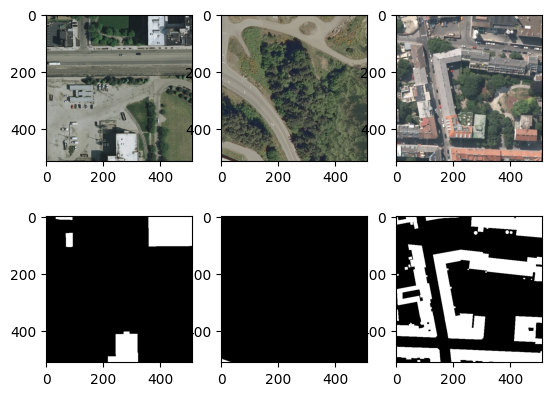

In [ ]:
# Plot some tiles with masks
import matplotlib.pyplot as plt

for i in range(3):
    image, mask = INRIA_train_tiled_dataset[i]
    plt.subplot(2, 3, i + 1)
    plt.imshow(image.permute(1, 2, 0), cmap="gray")
    plt.subplot(2, 3, 3 + i + 1)
    plt.imshow(mask.permute(1, 2, 0), cmap="gray")

plt.show()

Загрузка лучшей из обученных версий модели на предыдущих тайлах без пересечения.  Её дообучение с использованием той же функции `train`, которая использовалась ранее, и тех же `optimizer` и `criterion`.

Дообучение проводилось также за несколько раз (в связи с ограничением на используемые ресурсы в colab), здесь представлены результаты последней из итераций обучения. Хотя и не все 10 эпох дообучения пройдены видно, что ошибка loss не растет, а метрика IoU колеблется в окрестности 0.74.

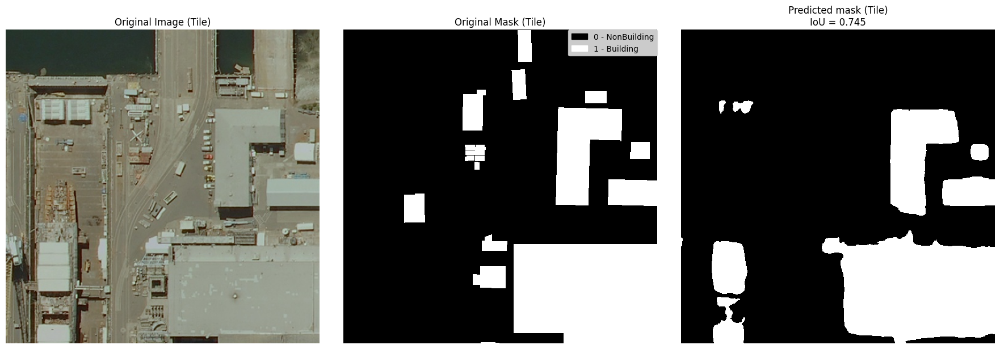

Epoch 6: train loss = 0.1530
Epoch 6: val loss = 0.1576
Epoch 6: val iou = 0.7452


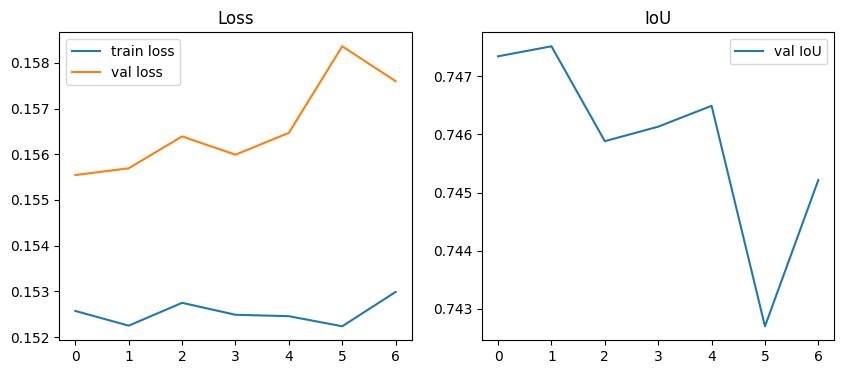

  0%|          | 0/1544 [00:00<?, ?it/s]

In [ ]:
import torch
import segmentation_models_pytorch as smp

device = 'cuda' if torch.cuda.is_available() else 'cpu'
torch.cuda.empty_cache()

# Initialisation (U-Net с resnet18, in_channels=3, classes=1)
loaded_model = smp.Unet(
    encoder_name="resnet50",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
).to(device)

# Best model
checkpoint_path = '/content/drive/MyDrive/checkpoints+/epoch_13_best_val_loss.pt'

# State_dict loading
loaded_model.load_state_dict(torch.load(checkpoint_path, map_location=device))

loaded_model.train()

# Optimizer and criterion defined earlier
epochs = 10
model_after_retraining, statistics_after_retraining = train(
    loaded_model,
    optimizer,
    criterion,
    epochs,
    INRIA_train_tiled_loader,
    INRIA_val_tiled_loader,
    device,
    ckpt_path,
    plot_loss = True
)


## Реализация функции предсказания на тестовых данных

Функция `predict_on_test_data` выполняет предсказания на тестовом наборе данных, рассчитывает метрики и отрисовывает несколько примеров для визуальной оценки.

In [ ]:
import torch
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

def predict_on_test_data(model, test_dataloader, metrics, device, num_samples_to_plot=3):
    model.eval()

    for metric in metrics:
        metric.reset()

    predictions_and_masks = []

    with torch.no_grad():
        for i, (X_batch, Y_batch) in enumerate(tqdm(test_dataloader)):
            X_batch = X_batch.to(device)
            Y_batch = Y_batch.to(device)
            Y_pred = model(X_batch)

            # Update metrics
            for metric in metrics:
                metric.update(Y_pred, Y_batch)

            if len(predictions_and_masks) < num_samples_to_plot:
                # Iterate through individual samples in the batch
                # Ensure we don't go out of bounds of the batch or exceed num_samples_to_plot
                for k in range(min(X_batch.shape[0], num_samples_to_plot - len(predictions_and_masks))):
                    predictions_and_masks.append({
                        'image': X_batch[k].cpu(),
                        'true_mask': Y_batch[k].cpu(),
                        'pred_mask': (Y_pred[k] > 0.5).cpu().squeeze(0)
                    })

    # Final metrics
    computed_metrics = {m.__class__.__name__: m.compute().item() for m in metrics}

    print("\n--- Test Set Metrics ---")
    for name, value in computed_metrics.items():
        print(f"{name}: {value:.4f}")

    # Visualization
    if num_samples_to_plot > 0:
        print("\n--- Visualization of Predictions ---")
        our_labels = {
            0: 'NonBuilding',
            1: 'Building',
        }
        for j, item in enumerate(predictions_and_masks):
            fig, axes = plt.subplots(1, 4, figsize=(24, 6)) #

            # Original Image
            original_image_np = item['image'].permute(1, 2, 0).numpy()
            axes[0].imshow(original_image_np)
            axes[0].set_title(f"Original Image (Sample {j+1})")
            axes[0].axis('off')

            # True Mask
            true_mask_np = item['true_mask'].squeeze(0).numpy()
            diagram_true = axes[1].imshow(true_mask_np, cmap='gray', interpolation='none')
            values_true = np.unique(true_mask_np)
            colors_true = [diagram_true.cmap(diagram_true.norm(value)) for value in values_true]
            patches_true = [mpatches.Patch(color=colors_true[k], label=f"{int(values_true[k])} - {our_labels[int(values_true[k])] }") for k in range(len(values_true))]
            axes[1].legend(handles=patches_true, bbox_to_anchor=(1.00, 1), loc=1, borderaxespad=0.)
            axes[1].set_title(f"True Mask (Sample {j+1})")
            axes[1].axis('off')

            # Predicted Mask
            predicted_mask_np = item['pred_mask'].numpy()
            diagram_pred = axes[2].imshow(predicted_mask_np, cmap='gray', interpolation='none')
            values_pred = np.unique(predicted_mask_np)
            colors_pred = [diagram_pred.cmap(diagram_pred.norm(value)) for value in values_pred]
            patches_pred = [mpatches.Patch(color=colors_pred[k], label=f"{int(values_pred[k])} - {our_labels[int(values_pred[k])] }") for k in range(len(values_pred))]
            axes[2].legend(handles=patches_pred, bbox_to_anchor=(1.00, 1), loc=1, borderaxespad=0.)
            axes[2].set_title(f"Predicted Mask (Sample {j+1})")
            axes[2].axis('off')

            # Overlay Predicted Mask on Original Image
            axes[3].imshow(original_image_np)
            overlay_mask_rgb = np.zeros_like(original_image_np) # Create a black image
            overlay_mask_rgb[predicted_mask_np == 1] = [1, 0, 0] # Set red color for predicted buildings

            # Overlay the colored mask with transparency
            axes[3].imshow(overlay_mask_rgb, alpha=0.5) # alpha=0.5 for 50% transparency
            axes[3].set_title(f"Overlay (Pred Mask on Original)")
            axes[3].axis('off')

            plt.tight_layout()
            plt.show()

    return computed_metrics

### Запуск функции предсказаний на тестовом наборе

Теперь вызовем функцию `predict_on_test_data` с моделью, которую мы дообучили и тестовым загрузчиком данных INRIA_test_tiled_loader, подготовленном на данных Inria Aerial Image Labeling Dataset (ранее в блокноте из обучющей выборки 10% данных были положены тестовыми).

Начинаем предсказания на тестовом наборе данных...


  0%|          | 0/882 [00:00<?, ?it/s]


--- Test Set Metrics ---
BinaryJaccardIndex: 0.7471
BinaryF1Score: 0.8553
BinaryAccuracy: 0.9535
BinaryRecall: 0.8872
BinaryPrecision: 0.8255

--- Visualization of Predictions ---


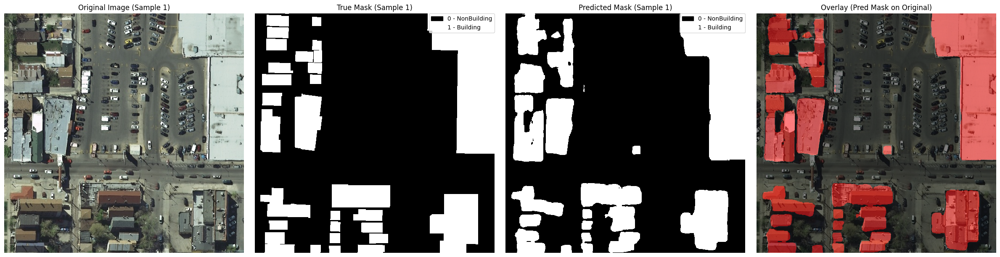

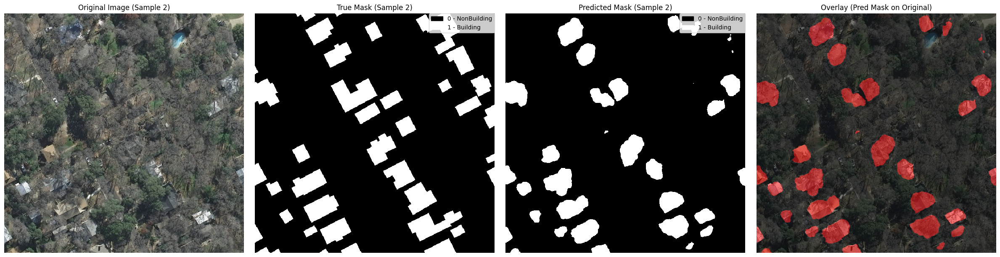

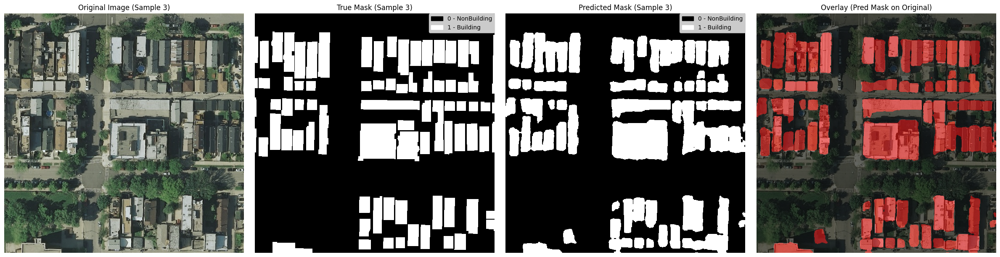

Предсказания на тестовом наборе завершены.


In [ ]:
import torch
import segmentation_models_pytorch as smp

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Model initialization
loaded_model = smp.Unet(
    encoder_name="resnet50",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
).to(device)

# Best Model path
checkpoint_path = '/content/drive/MyDrive/checkpoints+/BuildingSegment.pt'

# State_dict loading
loaded_model.load_state_dict(torch.load(checkpoint_path, map_location=device))
final_model = loaded_model
final_model.eval()

torch.cuda.empty_cache()

print("Начинаем предсказания на тестовом наборе данных...")
test_results = predict_on_test_data(
    final_model,
    INRIA_test_tiled_loader,
    metrics,
    device,
    num_samples_to_plot=3
)

print("Предсказания на тестовом наборе завершены.")

### Тестовые данные, размеченные самостоятельно

Проверка точности дообученной версии модели на тестовых данных, которые размечались самостоятельно. В качестве таких данных были выбраны изображения из папки test (для них маски отсутствуют). Создание маски описывается в отдельном ноутбуке.

Данные хранятся в директории test-2, также делятся на тайлы с пересечениями. Для них создаются датасеты и даталоадеры.

Процедуры практически аналогичны (с небольшими изменениями) процедурам для тестовой выборки один.

In [ ]:
import os
import cv2
import glob
import math
import numpy as np
import rasterio

# Target tile size
TARGET_SIZE = 512
OVERLAP_RATIO = 0.25  # 25% overlap
OVERLAP_SIZE = int(TARGET_SIZE * OVERLAP_RATIO)
STEP_SIZE = TARGET_SIZE - OVERLAP_SIZE  # Step size for sliding window

# Path to original test data. Assuming masks are in a 'gt' subdirectory here.
path_test = '/content/drive/MyDrive/AerialImageDataset/test-2'
path_test_images = os.path.join(path_test, "images")
path_test_masks = os.path.join(path_test, "gt") # Added for masks

# Output directories for tiled data
tiled_test_base_dir = '/content/tiled_test-2_overlap'
tiled_test_image_dir = os.path.join(tiled_test_base_dir, "images")
tiled_test_mask_dir = os.path.join(tiled_test_base_dir, "gt")

os.makedirs(tiled_test_image_dir, exist_ok=True)
os.makedirs(tiled_test_mask_dir, exist_ok=True)
img_paths = sorted(glob.glob(os.path.join(path_test_images, "*.tif")))
mask_paths = sorted(glob.glob(os.path.join(path_test_masks, "*.tif")))

for i, (img_path, mask_path) in enumerate(zip(img_paths, mask_paths)):
    img_filename = os.path.splitext(os.path.basename(img_path))[0]
    mask_filename = os.path.splitext(os.path.basename(mask_path))[0]

    # Load image and mask
    img = cv2.imread(img_path)
    with rasterio.open(mask_path) as src:
         mask = src.read(1)

    # Ensure filenames match and dimensions are consistent
    assert img_filename == mask_filename, f"Image and mask filenames do not match: {img_filename} vs {mask_filename}"
    assert img.shape[:2] == mask.shape[:2], f"Image and mask dimensions do not match for {img_filename}"

    img_h, img_w = img.shape[:2]
    k = 0  # Tile index

    # Generate start coordinates for y-axis with overlap
    y_starts = []
    for y in range(0, img_h, STEP_SIZE):
        y_starts.append(y)
    # Ensure the last tile covers the bottom edge if not already included
    if y_starts and (y_starts[-1] + TARGET_SIZE < img_h):
        y_starts.append(img_h - TARGET_SIZE)
    if not y_starts and img_h > 0:
        y_starts.append(0)
    y_starts = sorted(list(set(y_starts))) # Remove duplicates and sort

    # Generate start coordinates for x-axis with overlap
    x_starts = []
    for x in range(0, img_w, STEP_SIZE):
        x_starts.append(x)
    # Ensure the last tile covers the right edge if not already included
    if x_starts and (x_starts[-1] + TARGET_SIZE < img_w):
        x_starts.append(img_w - TARGET_SIZE)
    if not x_starts and img_w > 0:
        x_starts.append(0)
    x_starts = sorted(list(set(x_starts))) # Remove duplicates and sort

    for y_start in y_starts:
        for x_start in x_starts:
            # Adjust start coordinates for edge tiles to ensure TARGET_SIZE tiles
            current_y = min(y_start, img_h - TARGET_SIZE) if img_h > TARGET_SIZE else 0
            current_x = min(x_start, img_w - TARGET_SIZE) if img_w > TARGET_SIZE else 0

            # Extract the tile
            img_tile = img[current_y : current_y + TARGET_SIZE, current_x : current_x + TARGET_SIZE]
            mask_tile = mask[current_y : current_y + TARGET_SIZE, current_x : current_x + TARGET_SIZE]

            # Ensure tiles are TARGET_SIZE x TARGET_SIZE by padding if necessary
            if img_tile.shape[0] < TARGET_SIZE or img_tile.shape[1] < TARGET_SIZE:
                padded_img_tile = np.zeros((TARGET_SIZE, TARGET_SIZE, 3), dtype=img_tile.dtype)
                padded_img_tile[0:img_tile.shape[0], 0:img_tile.shape[1], :] = img_tile
                img_tile = padded_img_tile

                padded_mask_tile = np.zeros((TARGET_SIZE, TARGET_SIZE, mask_tile.shape[2] if mask_tile.ndim == 3 else 1), dtype=mask_tile.dtype)
                if mask_tile.ndim == 3:
                    padded_mask_tile[0:mask_tile.shape[0], 0:mask_tile.shape[1], :] = mask_tile
                else:
                    padded_mask_tile[0:mask_tile.shape[0], 0:mask_tile.shape[1]] = mask_tile
                mask_tile = padded_mask_tile

            # Save all tiles
            out_img_path = os.path.join(tiled_test_image_dir, f"{img_filename}_{k}.jpg")
            cv2.imwrite(out_img_path, img_tile)

            out_mask_path = os.path.join(tiled_test_mask_dir, f"{mask_filename}_{k}_m.png")
            cv2.imwrite(out_mask_path, mask_tile)

            k += 1
    print(f"Processed {img_filename} {i + 1}/{len(img_paths)}")
print(f"Tiling complete. Tiled images saved to {tiled_test_image_dir} and masks to {tiled_test_mask_dir}")

Processed bellingham29 1/5
Processed bloomington20 2/5
Processed innsbruck10 3/5
Processed sfo1 4/5
Processed tyrol-e26 5/5
Tiling complete. Tiled images saved to /content/tiled_test-2_overlap/images and masks to /content/tiled_test-2_overlap/gt


In [ ]:
import torch
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset, DataLoader
import cv2
import os
import numpy as np
import random

# Define Dataset class for tiled test images 2
class INRIATiledTest2(Dataset):
    def __init__(self, images_dir, masks_dir, transform=None):
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.transform = transform
        self.images = [
            f
            for f in sorted(os.listdir(self.images_dir))
            if f.endswith(('.jpg', '.jpeg', '.png', '.tif', '.tiff'))
        ]
        self.masks = [
            f
            for f in sorted(os.listdir(self.masks_dir))
            if f.endswith(('.jpg', '.jpeg', '.png', '.tif', '.tiff'))
        ]
        # Masks are sorted in the same way as images
        self.masks.sort(key=lambda x: x.replace('_m.png', ''))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_filename = self.images[idx]
        img_path = os.path.join(self.images_dir, img_filename)
        mask_path = os.path.join(self.masks_dir, self.masks[idx])

        # Read the image with OpenCV
        image = cv2.imread(img_path, cv2.IMREAD_COLOR)  # Read as BGR
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
        image = image.astype(np.float32) / 255.0  # Normalize to [0, 1]

        # Read the mask with rasterio
        with rasterio.open(mask_path) as src:
             mask = src.read(1)

        mask = (mask > 0.5).astype(np.float32) # Ensure it's 0.0 or 1.0

        # Apply transformations (to both image and mask)
        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented["image"]
            mask = augmented["mask"]

        # Expand the mask dimensions to add a channel dimension
        mask = mask.unsqueeze(dim=0)

        return image, mask

# Define transformations for test images (no augmentations needed, just ToTensorV2)
transform_test_no_labels = A.Compose(
    [
        ToTensorV2(),
    ]
)

# Define paths for the tiled test dataset
tiled_test_images_dir = '/content/tiled_test-2_overlap/images'
tiled_test_masks_dir = '/content/tiled_test-2_overlap/gt'

# Create the tiled dataset for test images 2
INRIA_test_2_dataset = INRIATiledTest2(
    images_dir=tiled_test_images_dir,
    masks_dir=tiled_test_masks_dir,
    transform=transform_test_no_labels
)

# Create a DataLoader for test images 2
INRIA_test_2_loader = DataLoader(
    dataset=INRIA_test_2_dataset, batch_size=4, shuffle=False, num_workers=2
)

print(f"Test Dataset (no labels) Length: {len(INRIA_test_2_dataset)}")

Test Dataset (no labels) Length: 980


Начинаем предсказания на тестовом наборе данных...


  0%|          | 0/245 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/rasterio/__init__.py:367: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)
/usr/local/lib/python3.12/dist-packages/rasterio/__init__.py:367: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)



--- Test Set Metrics ---
BinaryJaccardIndex: 0.7999
BinaryF1Score: 0.8888
BinaryAccuracy: 0.9767
BinaryRecall: 0.8745
BinaryPrecision: 0.9036

--- Visualization of Predictions ---


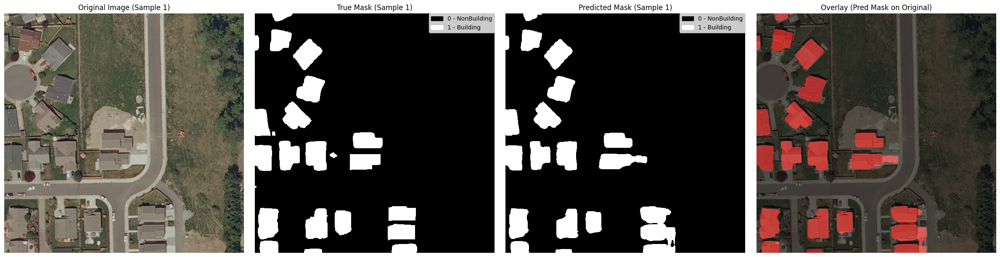

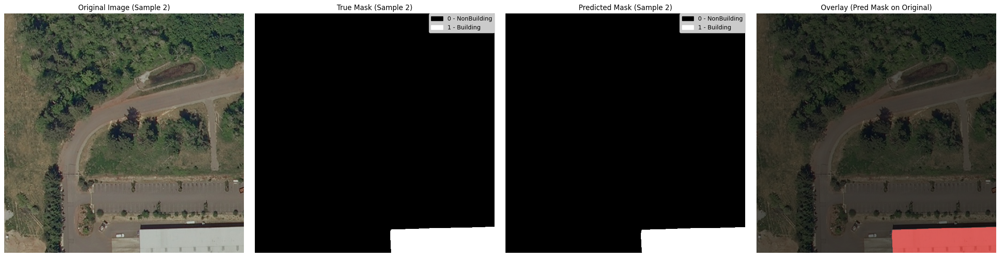

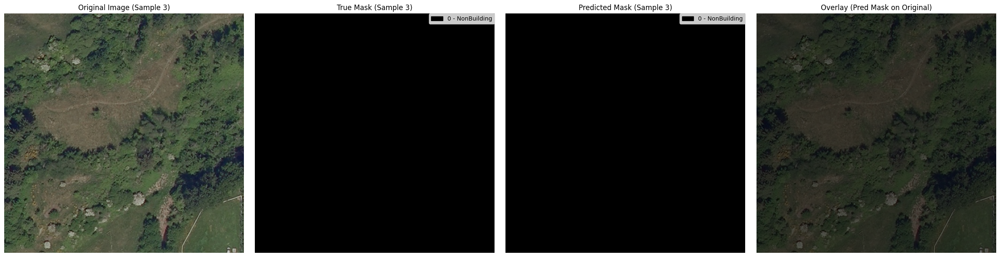

In [ ]:
import torchmetrics as tm
import torch
import segmentation_models_pytorch as smp

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Model initialization
loaded_model = smp.Unet(
    encoder_name="resnet50",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
).to(device)

# Best Model path
checkpoint_path = '/content/drive/MyDrive/checkpoints+/BuildingSegment.pt'

# State_dict loading
loaded_model.load_state_dict(torch.load(checkpoint_path, map_location=device))
final_model = loaded_model

metrics = [
    tm.JaccardIndex(task="binary", threshold=0.5).to(device), # IoU в torchmetrics это JaccardIndex
    tm.F1Score(task="binary", threshold=0.5).to(device), # F1-score
    tm.Accuracy(task="binary", threshold=0.5).to(device),
    tm.Recall(task="binary", threshold=0.5).to(device),
    tm.Precision(task="binary", threshold=0.5).to(device)
]

final_model.eval()

torch.cuda.empty_cache()

print("Начинаем предсказания на тестовом наборе данных...")
test_results = predict_on_test_data(
    final_model,
    INRIA_test_2_loader,
    metrics,
    device,
    num_samples_to_plot=3
)

#**Выводы**:

В целом, IoU ≈ 0.74 (на тестовой выборке 1) и IoU ≈ 0.79 (на тестовой выборке 2) — хороший результат для семантической сегментации зданий по спутниковым изображениям. Модель правильно идентифицирует большую часть зданий, но границы зданий не всегда точно соответствуют реальным зданиям.

Основные проблемы и особенности:

* В результате предсказаний модели получются довольно сглаженные границы зданий, что в основном связано с осбенностями архитектуры модели U-Net (пулинг + transposed conv)

* Влияние деревьев, особенно если они расположены вблизи зданий и кроной/тенью от кроны попадают на крыши зданий, тем самым мешая определению контура здания — похожая текстура, тени и сложные формы приводят к ошибкам сегментации.


* Расположенные близко друг к другу здания могут сливаться — семантическая сегментация классифицирует пиксели по классам, не различая отдельные экземпляры.

* Неоднозначные и сложные текстуры: иногда объекты - "не здания" имеют визуальные характеристики (текстуру, цвет, форму) очень похожие на здания, что приводит к ложным срабатываниям модели сегментации. Например, большие бетонные площадки, дороги, теплицы, бассейны или даже тени могут ошибочно идентифицироваться как части зданий или целые здания.


Следует отметить, что в работах [1,2] отмечается наличие ошибок в исходном датасете, связанных с несоответствием масок реальной ситуации. Это существенно влияет на качество обучения моделей семантической сегментации.

1. Ekiz S, Acar U. Improving building extraction from high-resolution aerial images: Error correction and performance enhancement using deep learning on the Inria dataset. Science Progress. 2025;108(1). doi:10.1177/00368504251318202 https://journals.sagepub.com/doi/10.1177/00368504251318202,
2. Milosavljević, Aleksandar. 2020. "Automated Processing of Remote Sensing Imagery Using Deep Semantic Segmentation: A Building Footprint Extraction Case" ISPRS International Journal of Geo-Information 9, no. 8: 486. https://doi.org/10.3390/ijgi9080486 https://www.mdpi.com/2220-9964/9/8/486

